# Accessing and plotting Digital Earth Africa data

Digital Earth Africa data can be accessed, inspected, and analysed in a range of computing environments. This notebook demonstrates how to access data using the [odc-stac](https://odc-stac.readthedocs.io/en/latest/) software package. It provides guidance on configuration, plotting, and cloud masking. 

Directly accessing Digital Earth Africa in an environment of choice offers advantages such as flexibly choosing the volume of compute resources required in a cloud environment, and the possibility of fusing Digital Earth Africa data with your own or other third party data. There are numerous environments in which this notebook and workflow can be run. This notebook was developed in [Sagemaker Studio Lab](https://studiolab.sagemaker.aws/) powered by AWS, which gives a similar computing environment to the Digital Earth Africa Sandbox. Alternative options include [Google Colab](https://colab.google/) or [installing Jupyter](https://jupyter.org/) and running it on a local device. 

Both Colab and SageMaker have free tiers which are sufficient for running this notebook. For larger applications and upscaling, you might consider larger compute instances which can be purchased through cloud computing providers.

The notebook runs through the following:
1. Configuring an environment to access Digital Earth Africa data.
2. Loading Sentinel-2 surface reflectance from Digital Earth Africa.
3. Plotting Sentinel-2 images using functions from the Digital Earth Africa Tools package.
4. Cloud masking Sentinel-2 images.
5. Loading a Digital Elevation Model from Digital Earth Africa.
6. Loading a Digital Earth Africa geomedian and combining it with a Digital Elevation Model for a cool plot.

## Install and import packages

Depending on your environment, you may need to install some packages before importing them. The installation commands in the cell below are effective in Sagemaker Studio Lab (with kernel set to `sagemaker-distribution:Python`) and Google Colab.

If you are running the notebook for the first time, you can remove the `#`s and run the cell below. Often it is more aesthetic to add the `#`s back in after the cell has run because the outputs take a lot of space!

You may see some dependency resolver errors in the output, though this should not affect performance and did not during testing in Colab and SageMaker.

In [1]:
#!pip install pystac==1.10.0 --force-reinstall
#!pip install odc-stac
#!pip install osmnx
#!pip install pystac_client
#!pip install session-info
#!pip install odc-algo
#!pip install matplotlib

In [2]:
import matplotlib.pyplot as plt
import session_info
import odc.algo
import numpy as np

from pystac_client import Client
from odc.stac import configure_rio, stac_load
from matplotlib.colors import LightSource

### Session Info

When working across different environments, it's helpful to display the software 'image' under which the script was developed. The cell below uses the `session_info` package to show package and Python versions used. This could be helpful if you experience bugs or software conflights when applying this script as you can refer to the package and Python versions below.

In [3]:
session_info.show()

## Configure Sentinel-2 Data

The first Digital Earth Africa product we'll load is the Sentinel-2 surface reflectance. To do this, we have to set the data configuration as per the cell below. The configuration is set as a dictionary object (`dict`) in Python.

We can use the [product definition](https://explorer.digitalearth.africa/products/s2_l2a_c1#definition-doc) on Digital Earth Africa explorer to help build the dictionary. 

In [4]:
config = {
    "s2_l2a_c1": {
        "assets": {
            "*": {
                "data_type": "uint16",
                "nodata": 0,
                "unit": "1",
            },
            "scl": {
                "data_type": "uint8",
                "nodata": 0,
                "unit": "1",
            },
        },
    }
}

### Set AWS endpoint

The `configure_rio` command sets the AWS endpoint we need to request the data from. The [location information](https://explorer.digitalearth.africa/products/s2_l2a_c1#location) can help us identify the correct AWS endpoint. There's also information on the AWS specifications in the [direct access documentation](https://docs.digitalearthafrica.org/en/latest/platform_tools/direct_access.html).

In [5]:
configure_rio(
    cloud_defaults=True,
    aws={"aws_unsigned": True},
    AWS_S3_ENDPOINT="s3.af-south-1.amazonaws.com",
)

### Open the STAC catalog

Explorer provides the STAC catalog we use the identify the data we're requesting. 

As of April 2025, there are challenges with the volume of traffic on Explorer which causes periodic outages. If this cell returns a `503 Service Temporarily Unavailable` please try again in a few moments. There's also information on the Digital Earth Africa STAC endpoint in the [direct access documentation](https://docs.digitalearthafrica.org/en/latest/platform_tools/direct_access.html).

In [6]:
# Open the stac catalogue
catalog = Client.open("https://explorer.digitalearth.africa/stac")

## Set area and period of interest

Similar to working with any other spatiotemporal data, we set our area of interest with a bounding box and period of interest with a start and end date. In this case, we're looking at an irrigation scheme in south-west Zimbabwe.

In [7]:
# Set a bounding box
# [xmin, ymin, xmax, ymax] in latitude and longitude
bbox = [29.26, -20.82, 29.32, -20.77]

# Set a start and end date
start_date = "2024-12-01"
end_date = "2024-12-31"

# Set the STAC collections
collections = ["s2_l2a_c1"]

Build a STAC query based on the area and period of interest. This cell returns the number of datasets that match our STAC query. Note that these may represent different times, or they may be datasets that overlap in space (if there are multiple matches).

In [8]:
# Build a query with the set parameters
query = catalog.search(
    bbox=bbox, collections=collections, datetime=f"{start_date}/{end_date}"
)

# Search the STAC catalog for all items matching the query
items = list(query.items())
print(f"Found: {len(items):d} datasets")

Found: 20 datasets


Next, we set the parameters for data loading such as the coordinate reference system (crs) and bands we want to load using the [`stac_load` function](https://odc-stac.readthedocs.io/en/latest/_api/odc.stac.load.html).

This returns an `xarray` object which makes it easy to deal with numerous dimensions.

In [9]:
crs = "EPSG:6933"
resolution = 10

ds = stac_load(
    items,
    bands=("red", "green", "blue", "nir", "scl"),
    crs=crs,
    resolution=resolution,
    chunks={},
    groupby="solar_day",
    stac_cfg=config,
    bbox=bbox,
)

# View the Xarray Dataset
ds

<xarray.Dataset> Size: 41MB
Dimensions:      (y: 598, x: 580, time: 13)
Coordinates:
  * y            (y) float64 5kB -2.594e+06 -2.594e+06 ... -2.599e+06 -2.599e+06
  * x            (x) float64 5kB 2.823e+06 2.823e+06 ... 2.829e+06 2.829e+06
    spatial_ref  int32 4B 6933
  * time         (time) datetime64[ns] 104B 2024-12-01T08:15:51.272000 ... 20...
Data variables:
    red          (time, y, x) uint16 9MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>
    green        (time, y, x) uint16 9MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>
    blue         (time, y, x) uint16 9MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>
    nir          (time, y, x) uint16 9MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>
    scl          (time, y, x) uint8 5MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>

### Define a true-colour plotting function

This step shows how we can adapt some of the functions in the [Digital Earth Africa Tools package](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks/tree/main/Tools) to work in different environments.

In this case, we're defining a function called `rgb` referring to true-colour plotting of satellite images with the red, green, and blue bands. The cell below shows how [source code](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks/blob/main/Tools/deafrica_tools/plotting.py) from the plotting module of the Tools package can be adapted into external environments.

In [10]:
def rgb(
    ds,
    bands=["red", "green", "blue"],
    index=None,
    index_dim="time",
    robust=True,
    percentile_stretch=None,
    col_wrap=4,
    size=6,
    aspect=None,
    **kwargs,
):
    """
    Takes an xarray dataset and plots RGB images using three imagery
    bands (e.g ['red', 'green', 'blue']). The `index`
    parameter allows easily selecting individual or multiple images for
    RGB plotting. Images can be saved to file by specifying an output
    path using `savefig_path`.
    This function was designed to work as an easier-to-use wrapper
    around xarray's `.plot.imshow()` functionality.

    Parameters
    ----------
    ds : xarray Dataset
        A two-dimensional or multi-dimensional array to plot as an RGB
        image. If the array has more than two dimensions (e.g. multiple
        observations along a 'time' dimension), either use `index` to
        select one (`index=0`) or multiple observations
        (`index=[0, 1]`), or create a custom faceted plot using e.g.
        `col="time"`.
    bands : list of strings, optional
        A list of three strings giving the band names to plot. Defaults
        to '['red', 'green', 'blue']'. If the dataset does not contain
        bands named `'red', 'green', 'blue'`, then `bands` must be
        specified.
    index : integer or list of integers, optional
        `index` can be used to select one (`index=0`) or multiple
        observations (`index=[0, 1]`) from the input dataset for
        plotting. If multiple images are requested these will be plotted
        as a faceted plot.
    index_dim : string, optional
        The dimension along which observations should be plotted if
        multiple observations are requested using `index`. Defaults to
        `time`.
    robust : bool, optional
        Produces an enhanced image where the colormap range is computed
        with 2nd and 98th percentiles instead of the extreme values.
        Defaults to True.
    percentile_stretch : tuple of floats
        An tuple of two floats (between 0.00 and 1.00) that can be used
        to clip the colormap range to manually specified percentiles to
        get more control over the brightness and contrast of the image.
        The default is None; '(0.02, 0.98)' is equivelent to
        `robust=True`. If this parameter is used, `robust` will have no
        effect.
    col_wrap : integer, optional
        The number of columns allowed in faceted plots. Defaults to 4.
    size : integer, optional
        The height (in inches) of each plot. Defaults to 6.
    aspect : integer, optional
        Aspect ratio of each facet in the plot, so that aspect * size
        gives width of each facet in inches. Defaults to None, which
        will calculate the aspect based on the x and y dimensions of
        the input data.
    Returns
    -------
    An RGB plot of one or multiple observations, and optionally an image
    file written to file.
    """

    # If bands are not in the dataset
    ds_vars = list(ds.data_vars)
    if set(bands).issubset(ds_vars) is False:
        raise ValueError(
            "rgb() bands do not match band names in dataset. "
            "Note the default rgb() bands are ['red', 'green', 'blue']."
        )

    # If ax is supplied via kwargs, ignore aspect and size
    if "ax" in kwargs:

        # Create empty aspect size kwarg that will be passed to imshow
        aspect_size_kwarg = {}
    else:
        # Populate aspect size kwarg with aspect and size data
        aspect_size_kwarg = {"aspect": aspect, "size": size}

    # If no value is supplied for `index` (the default), plot using default
    # values and arguments passed via `**kwargs`
    if index is None:

        # Select bands and convert to DataArray
        da = ds[bands].to_array()

        # If percentile_stretch == True, clip plotting to percentile vmin, vmax
        if percentile_stretch:
            vmin, vmax = da.compute().quantile(percentile_stretch).values
            kwargs.update({"vmin": vmin, "vmax": vmax})

        # If there are more than three dimensions and the index dimension == 1,
        # squeeze this dimension out to remove it
        if (len(ds.dims) > 2) and ("col" not in kwargs) and (len(da[index_dim]) == 1):

            da = da.squeeze(dim=index_dim)

        # If there are more than three dimensions and the index dimension
        # is longer than 1, raise exception to tell user to use 'col'/`index`
        elif (len(ds.dims) > 2) and ("col" not in kwargs) and (len(da[index_dim]) > 1):

            raise Exception(
                "The input dataset `ds` has more than two dimensions: "
                f"{list(ds.dims.keys())}. Please select a single observation "
                "using e.g. `index=0`, or enable faceted plotting by adding "
                'the arguments e.g. `col="time", col_wrap=4` to the function '
                "call"
            )
        da = da.compute()
        img = da.plot.imshow(robust=robust, col_wrap=col_wrap, **aspect_size_kwarg, **kwargs)

    # If values provided for `index`, extract corresponding observations and
    # plot as either single image or facet plot
    else:

        # If a float is supplied instead of an integer index, raise exception
        if isinstance(index, float):
            raise Exception("Please supply `index` as either an integer or a list of integers")

        # If col argument is supplied as well as `index`, raise exception
        if "col" in kwargs:
            raise Exception("Cannot supply both `index` and `col`; please remove one and try again")

        # Convert index to generic type list so that number of indices supplied
        # can be computed
        index = index if isinstance(index, list) else [index]

        # Select bands and observations and convert to DataArray
        da = ds[bands].isel(**{index_dim: index}).to_array().compute()

        # If percentile_stretch == True, clip plotting to percentile vmin, vmax
        if percentile_stretch:
            vmin, vmax = da.compute().quantile(percentile_stretch).values
            kwargs.update({"vmin": vmin, "vmax": vmax})

        # If multiple index values are supplied, plot as a faceted plot
        if len(index) > 1:

            img = da.plot.imshow(
                robust=robust,
                col=index_dim,
                col_wrap=col_wrap,
                **aspect_size_kwarg,
                **kwargs,
            )

        # If only one index is supplied, squeeze out index_dim and plot as a
        # single panel
        else:

            img = da.squeeze(dim=index_dim).plot.imshow(
                robust=robust, **aspect_size_kwarg, **kwargs
            )

Next, the `rgb` function is appplied to Sentinel-2 imagery we loaded. 

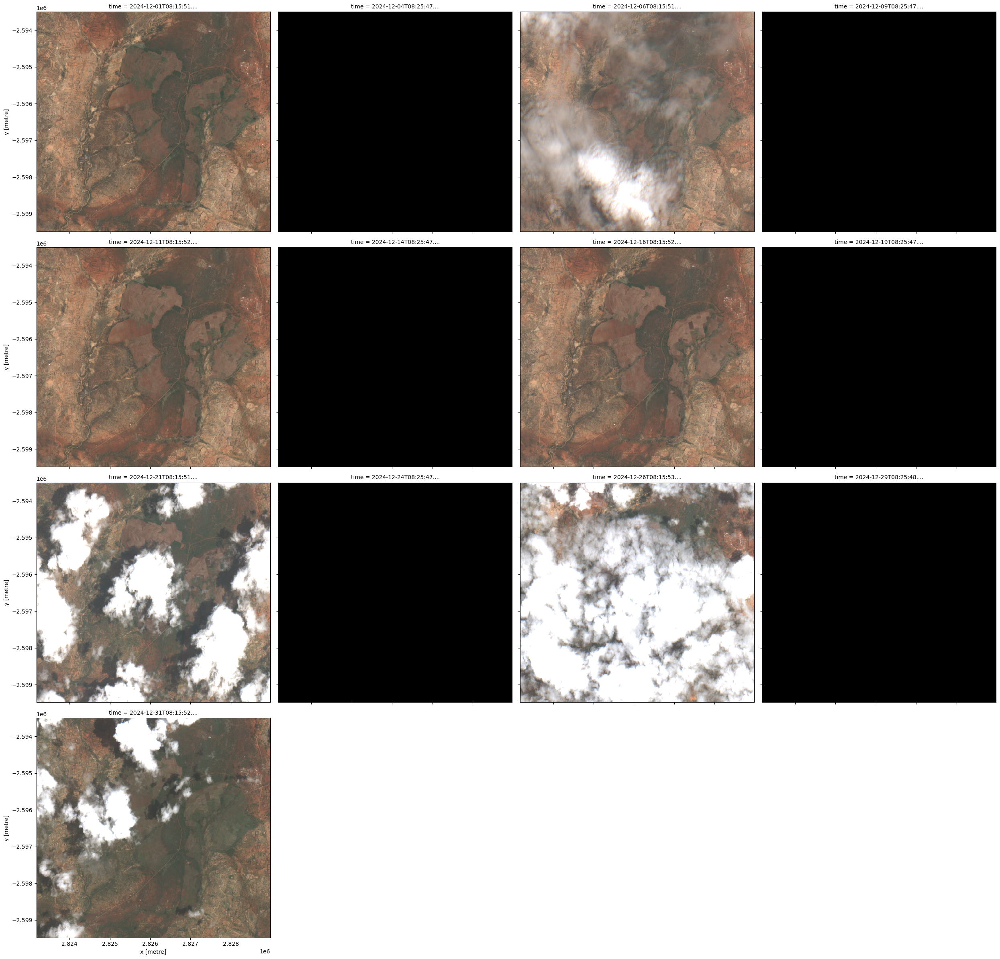

In [ ]:
rgb(ds, col='time', percentile_stretch=(0.05,0.95))

Notice in the plot that we've picked up a few black images where there is no data. This can be the result of STAC identifying the edges of some scenes. We can remove these with some `xarray` operations as below.

In [12]:
ds = ds.where(ds > 0).dropna(dim='time')
ds

<xarray.Dataset> Size: 49MB
Dimensions:      (time: 7, y: 598, x: 580)
Coordinates:
  * y            (y) float64 5kB -2.594e+06 -2.594e+06 ... -2.599e+06 -2.599e+06
  * x            (x) float64 5kB 2.823e+06 2.823e+06 ... 2.829e+06 2.829e+06
    spatial_ref  int32 4B 6933
  * time         (time) datetime64[ns] 56B 2024-12-01T08:15:51.272000 ... 202...
Data variables:
    red          (time, y, x) float32 10MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>
    green        (time, y, x) float32 10MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>
    blue         (time, y, x) float32 10MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>
    nir          (time, y, x) float32 10MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>
    scl          (time, y, x) float32 10MB dask.array<chunksize=(1, 598, 580), meta=np.ndarray>

## Cloud masking

Applying cloud masking to Sentinel-2 data is possible through the use of the scene classification layer (`scl`). We need to apply a dictionary as an attribute to this band which stores pixel classifications as integers. The cell below applies a dictionary for each value in the `scl`. Once again, the [product definition documentation](https://explorer.digitalearth.africa/products/s2_l2a_c1#definition-doc) in Explorer helps us create the dictionary by showing the `flags_definition` for the `scl` band.

In [13]:
ds.scl.attrs = {'units': '1',
                 'nodata': 0,
                 'flags_definition': {'qa': {'bits': [0, 1, 2, 3, 4, 5, 6, 7],
                   'values': {'0': 'no data',
                    '1': 'saturated or defective',
                    '2': 'dark area pixels',
                    '3': 'cloud shadows',
                    '4': 'vegetation',
                    '5': 'bare soils',
                    '6': 'water',
                    '7': 'unclassified',
                    '8': 'cloud medium probability',
                    '9': 'cloud high probability',
                    '10': 'thin cirrus',
                    '11': 'snow or ice'},
                   'description': 'Sen2Cor Scene Classification'}},
                 'crs': 'EPSG:6933',
                 'grid_mapping': 'spatial_ref'}

Once the attribute is defined, we can use some tools from the `odc` packages to assist with cloud masking. In the function below, we include each of the categories we'd like to exclude from the images. You can experiment with including/excluding various categories to see the effects. The `enum_to_bool` function refers to 'enumerate to boolean', so we can easily exclude data based on a boolean (0, 1) definition.

In [14]:
pq_mask = odc.algo.enum_to_bool(mask=ds["scl"], categories=(
        "cloud high probability",
        "cloud medium probability",
        "thin cirrus",
        "cloud shadows",
        "saturated or defective"))

Next, we apply some `xarray` functions to complete the masking process, again drawing on functions from the `odc` package.

In [15]:
valid_data_mask = (ds > 1).to_array(dim="band").all(dim="band")
ds =  odc.algo.keep_good_only(ds, where=valid_data_mask)
ds = odc.algo.erase_bad(ds, where=pq_mask)

Next, we can plot the resulting dataset to checkout the cloud masking.

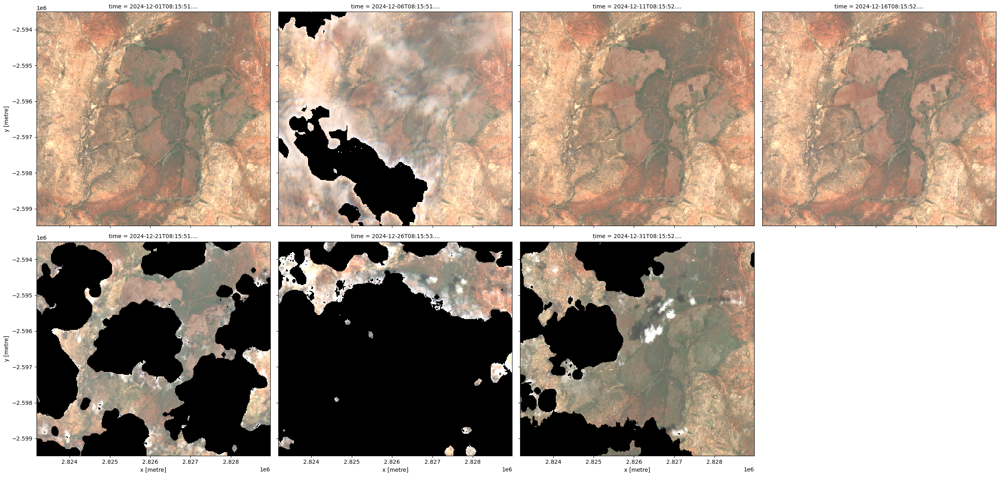

In [16]:
rgb(ds, col='time')

## Load Digital Elevation Model

We can set a configuration dictionary to retrieve any dataset available on the Digital Earth Africa Open Data Cube, including those stored in external locations such as the Copernicus Digital Elevation Model. 

Again, the [product definition documentation](https://explorer-latest.digitalearth.africa/products/dem_cop_30#definition-doc) can help us build the dictionary as below.

In [17]:
config = {
    "dem_cop_30": {
        "assets": {
            "*": {
                "data_type": "float32",
                "nodata": "NaN",
                "unit": "1",
            },
        },
    }
}

Next, we configure the AWS endpoint by referring to the [location information](https://explorer.digitalearth.africa/products/dem_cop_30#location) on Explorer.

In [18]:
configure_rio(
    cloud_defaults=True,
    aws={"aws_unsigned": True},
    AWS_S3_ENDPOINT="s3.eu-central-1.amazonaws.com",
)

We set a bounding box for our query. In this case we are interested in Mt Kilimanjaro in Tanzania because we're interested in combining elevation data with surface reflectance, so a mountain is a nice example.

In [19]:
# Set a bounding box
# [xmin, ymin, xmax, ymax] in latitude and longitude
bbox = [37, -3.37, 37.7, -2.84]

# Set the STAC collections
collections = ["dem_cop_30"]

Next, we run the STAC query. Note that we don't need to specify a time period because a Digital Elevation Model is a static product.

In [20]:
# Build a query with the set parameters
query = catalog.search(
    bbox=bbox, collections=collections
)

# Search the STAC catalog for all items matching the query
items = list(query.items())
print(f"Found: {len(items):d} datasets")

Found: 2 datasets


The `stac_load` function enables us to set desired `crs`, `resolution`, and other parameters relevant to the product we're querying.

In [21]:
crs = "EPSG:6933"
resolution = 30

ds_elev = stac_load(
    items,
    bands=("elevation"),
    crs=crs,
    resolution=resolution,
    chunks={},
    stac_cfg=config,
    bbox=bbox,
)

# View the Xarray Dataset
ds_elev

<xarray.Dataset> Size: 20MB
Dimensions:      (y: 2251, x: 2253, time: 1)
Coordinates:
  * y            (y) float64 18kB -3.622e+05 -3.622e+05 ... -4.297e+05
  * x            (x) float64 18kB 3.57e+06 3.57e+06 ... 3.638e+06 3.638e+06
    spatial_ref  int32 4B 6933
  * time         (time) datetime64[ns] 8B 1900-01-01
Data variables:
    elevation    (time, y, x) float32 20MB dask.array<chunksize=(1, 2251, 2253), meta=np.ndarray>

Plotting the Digital Elevation Model with the terrain colour map shows a neat illustration of the patterns in elevation for Mt Kilimanjaro.

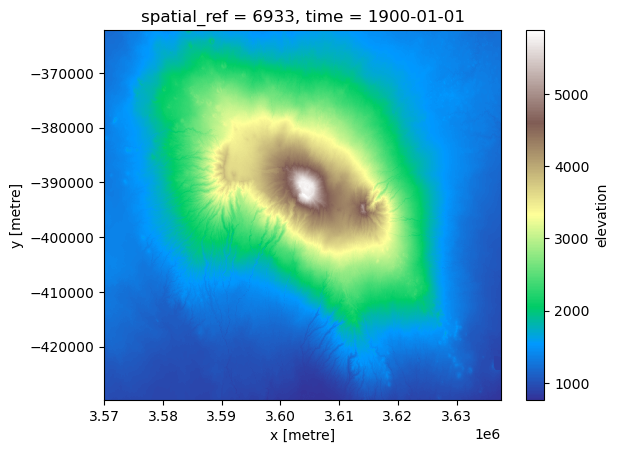

In [22]:
ds_elev.squeeze().elevation.plot(cmap='terrain')

## Load Landsat-8 & 9 Geomedian

The Digital Earth Africa Geomedian products are cloud-free composite images that can easily be applied to visualisation and analytical workflows.

In this case, we're loading the Landsat-8 and Landsat-9 Geomedian because it matches the spatial resolution of the 30-m Copernicus Digital Elevation Model, so they'll make a neat visualisation when combined.

The cell below configures a dictionary for the product, again drawing on the [product definition](https://explorer.digitalearth.africa/products/gm_ls8_ls9_annual#definition-doc) in Explorer. In this case, we only define aliases for the bands we're interested in.

In [23]:
config = {
    "gm_ls8_ls9_annual": {
        "assets": {
            "*": {
                "data_type": "uint16",
                "nodata": 0,
                "unit": "1",
            },
        },
        "aliases": {
            "blue": "SR_B2",
            "green": "SR_B3",
            "red": "SR_B4",
        },
    }
}

We set the AWS endpoint to the `af-south-1` region because the Landsat-8 & 9 Geomedian as a Digital Earth Africa product as shown in the [location information](https://explorer.digitalearth.africa/products/gm_ls8_ls9_annual#location) on Explorer.

In [24]:
configure_rio(
    cloud_defaults=True,
    aws={"aws_unsigned": True},
    AWS_S3_ENDPOINT="s3.af-south-1.amazonaws.com",
)

We can use the bounding box for Mt Kilimanjaro that we set previously, so we only have to set the period of interest which in this case is the calendar year 2022. The collection is the product name as it appears in Explorer, in this case `gm_ls8_ls9_annual`.

In [25]:
# Set a start and end date
start_date = "2022-01-01"
end_date = "2022-12-31"

# Set the STAC collections
collections = ["gm_ls8_ls9_annual"]

Next, we run the STAC query and see how many items are returned.

In [26]:
# Build a query with the set parameters
query = catalog.search(
    bbox=bbox, collections=collections, datetime=f"{start_date}/{end_date}"
)

# Search the STAC catalog for all items matching the query
items = list(query.items())
print(f"Found: {len(items):d} datasets")

Found: 2 datasets


The `stac_load` function is run as done previously, specifying that we only want the red, green, and blue bands in this case for true colour visualisation.

In [27]:
crs = "EPSG:6933"
resolution = 30

ds = stac_load(
    items,
    bands=("red", "green", "blue"),
    crs=crs,
    resolution=resolution,
    chunks={},
    stac_cfg=config,
    bbox=bbox,
)

ds

<xarray.Dataset> Size: 30MB
Dimensions:      (y: 2251, x: 2253, time: 1)
Coordinates:
  * y            (y) float64 18kB -3.622e+05 -3.622e+05 ... -4.297e+05
  * x            (x) float64 18kB 3.57e+06 3.57e+06 ... 3.638e+06 3.638e+06
    spatial_ref  int32 4B 6933
  * time         (time) datetime64[ns] 8B 2022-01-01
Data variables:
    red          (time, y, x) uint16 10MB dask.array<chunksize=(1, 2251, 2253), meta=np.ndarray>
    green        (time, y, x) uint16 10MB dask.array<chunksize=(1, 2251, 2253), meta=np.ndarray>
    blue         (time, y, x) uint16 10MB dask.array<chunksize=(1, 2251, 2253), meta=np.ndarray>

Plot the surface reflectance geomedian.

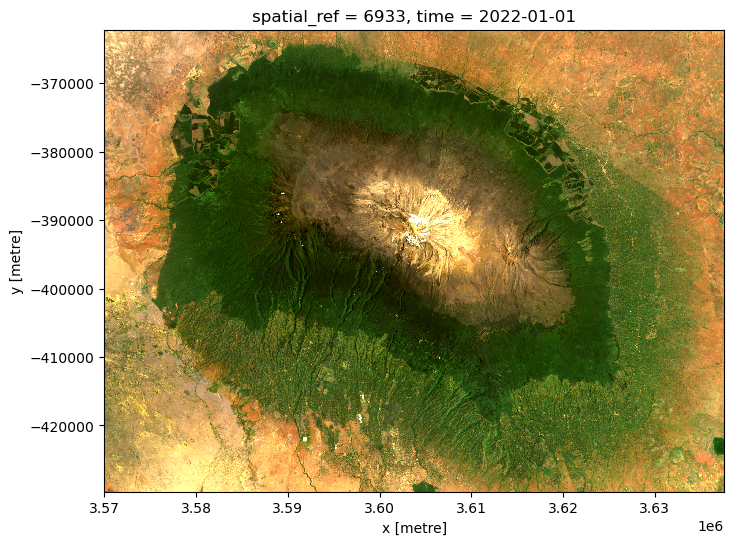

In [28]:
rgb(ds.squeeze())

## Plot a combined elevation and geomedian image with shading effects

To create a shaded true-colour image with elevation, we need to create an xarray object where bands is a dimension, as below. We also conduct scaling of the reflectance values to fall between 0 and 1 so they can be accepted by matplotlib.

Within the scaling, values are also clipped between the 1st and 99th percentiles which enhances the visualisation. You can experiment with changing the quantiles to see how it affects the image.

In [29]:
quants = np.quantile(ds.to_array(), 0.01), np.quantile(ds.to_array(), 0.99) # set quantiles

bands=['red', 'green', 'blue']

ds_rgb = ds[bands].squeeze().to_array().transpose('y','x','variable').clip(quants[0], quants[1])/np.max(
    ds[bands].squeeze().to_array().transpose('y','x','variable').clip(quants[0], quants[1]))

ds_rgb

<xarray.DataArray (y: 2251, x: 2253, variable: 3)> Size: 122MB
dask.array<truediv, shape=(2251, 2253, 3), dtype=float64, chunksize=(2251, 2253, 1), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 18kB -3.622e+05 -3.622e+05 ... -4.297e+05
  * x            (x) float64 18kB 3.57e+06 3.57e+06 ... 3.638e+06 3.638e+06
    spatial_ref  int32 4B 6933
    time         datetime64[ns] 8B 2022-01-01
  * variable     (variable) object 24B 'red' 'green' 'blue'

To add shading effect to the image, we use the `LightSource` function where we specify the azimuth degree (0-360 clockwise from North) and the altitude angle (0-90 upwards from horizontal). You can experiment with different values to check the effect on shading.

In [33]:
ls = LightSource(azdeg=315, altdeg=45)
ds_im = ls.shade_rgb(rgb = ds_rgb, elevation = ds_elev.elevation.squeeze().to_numpy(), fraction = 1.2, blend_mode='overlay')

Finally, we plot and save the image of Mt Kilimanjaro.

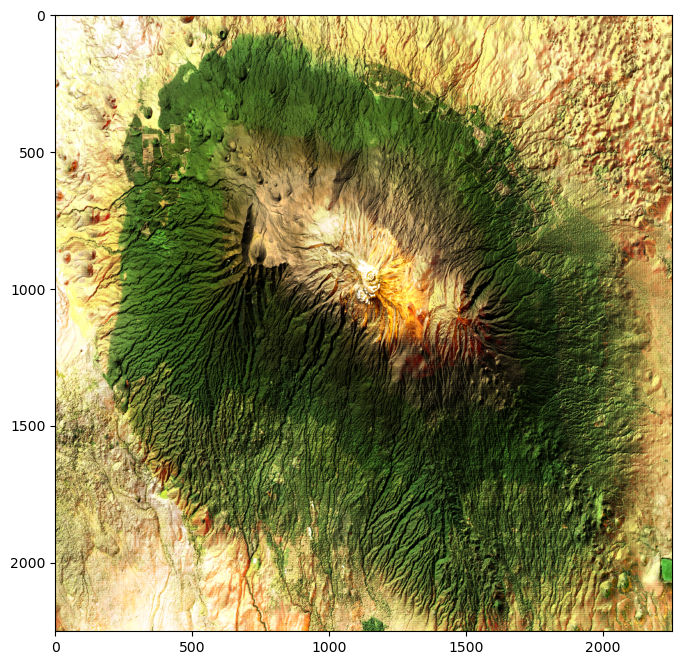

In [34]:
plt.figure(figsize = (16,8))
plt.imshow(ds_im)
plt.savefig('Kilimanjaro.jpg')

## Conclusion and next steps

This notebook has demonstrating loading Digital Earth Africa data and applying some functionality from the Digital Earth Africa Tools package. You could adapt these processes to Digital Earth Africa products and services of your interest.

---

## Additional information

<b> License </b> The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0).

Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

<b> Contact </b> If you need assistance, please post a question on the [DE Africa Slack channel](https://digitalearthafrica.slack.com/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).

If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Last Tested:**

In [32]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')

'2025-04-11'